Norm factor =  7.400126e-05


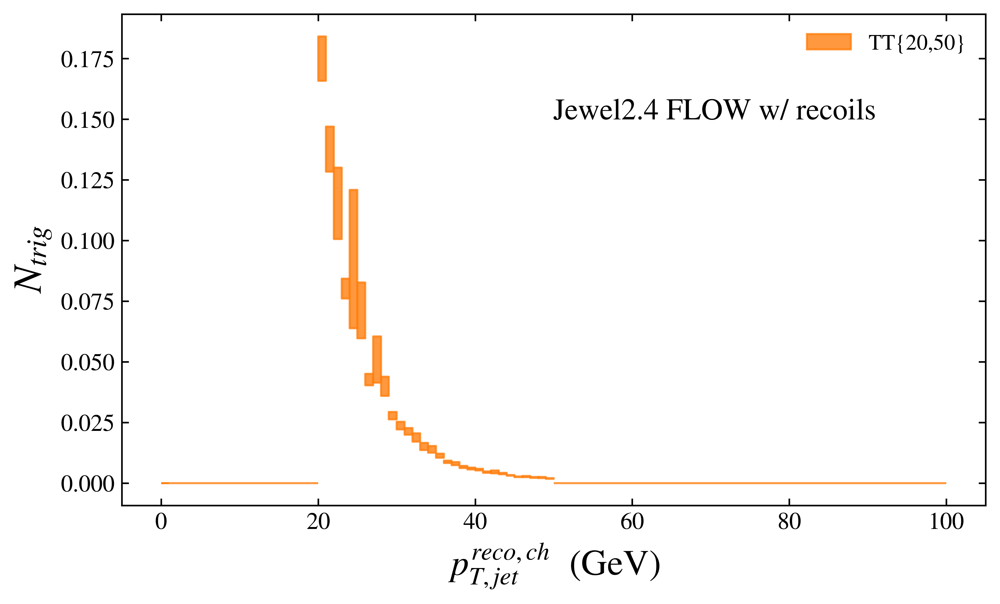

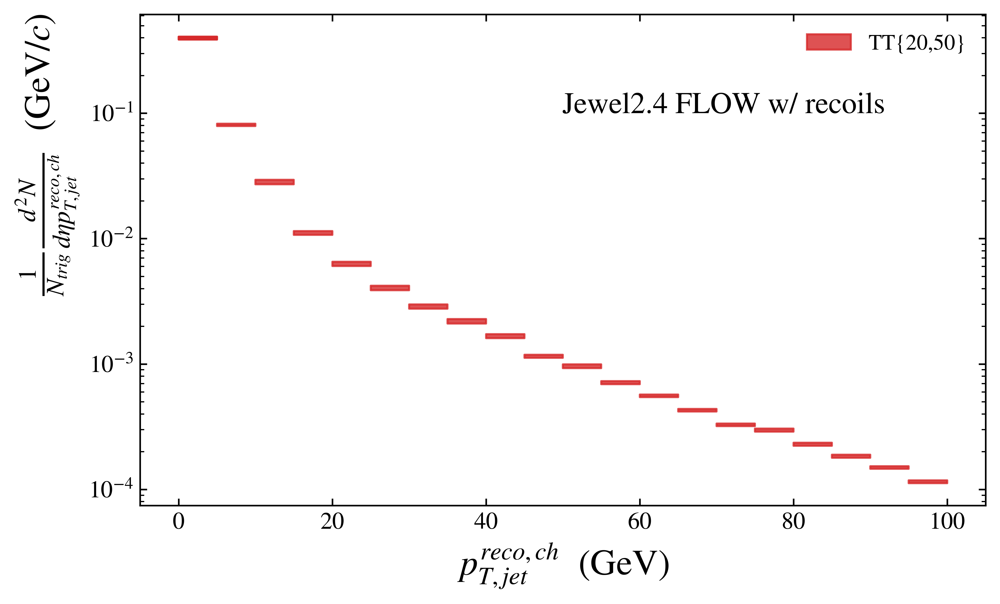

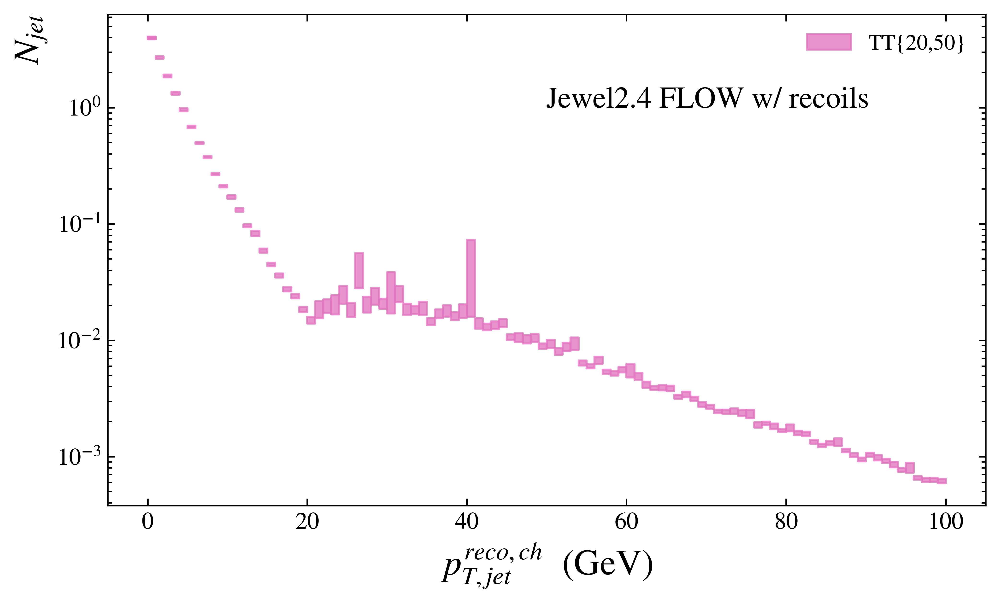

In [14]:
#Gráficos para espectro de Ntrig 20 a 50
import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'
obs_ntrig = '/SEMIINCLUSIVE_HJET/hNtrig_20_50'
obs_jet = '/SEMIINCLUSIVE_HJET/Njet_20_50'
obs_alljet = '/SEMIINCLUSIVE_HJET/Njet_all_20_50'

histos = yoda.read(output)
    
Ntrig = histos[obs_ntrig]   
Njet = histos[obs_jet]   
Nalljet = histos[obs_alljet]



#Ntrig.rebin(6)
x = np.asarray(Ntrig.xVals())
y = np.asarray(Ntrig.yVals())
yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)


Norm = Ntrig.sumW()
print('Norm factor = ',Norm)

arrNt = [x, y/Norm, yerr/Norm, xerr] 


Njet.rebin(5)
xj = np.asarray(Njet.xVals())
yj = np.asarray(Njet.yVals()/Norm)
yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

arrj = [xj,yj,yerrj,xerrj]

xallj = np.asarray(Nalljet.xVals())
yallj = np.asarray(Nalljet.yVals()/Norm)
yerrallj = np.asarray((Nalljet.yMaxs() - Nalljet.yMins()) / (2*Norm))
xerrallj = np.asarray((Nalljet.xMaxs() - Nalljet.xMins()) / 2)

arrallj = [xallj,yallj,yerrallj,xerrallj]


minpt = 0

plt.figure(1)

for k in range(minpt, arrNt[0].size):
    xhigh = arrNt[0][k] + arrNt[3][k]
    xlow = arrNt[0][k] - arrNt[3][k]
    yhigh = arrNt[1][k] + arrNt[2][k]
    ylow = arrNt[1][k] - arrNt[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', label='TT{20,50}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
    plt.legend(frameon = 0)




# Define plot
#plt.figure(1)
#plt.errorbar(x, y/Norm, yerr/Norm, xerr, color='orange', fmt='o', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{20,50}')
#plt.plot(x, y, color='bisque', linestyle='--')



#plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{trig}$')
#plt.ylim(10**(-4),10**(0))
#plt.xlim(19.5,50.5)
plt.text(50,0.15,'Jewel2.4 FLOW w/ recoils')
#plt.title('')
plt.legend(frameon = 0)



# Save
plt.savefig('Graphs/Ntrig.pdf')


# Define plot
plt.figure(2)



for k in range(minpt, arrj[0].size):
    xhigh = arrj[0][k] + arrj[3][k]
    xlow = arrj[0][k] - arrj[3][k]
    yhigh = arrj[1][k] + arrj[2][k]
    ylow = arrj[1][k] - arrj[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
    plt.legend(frameon = 0)






#plt.errorbar(xj, yj, yerrj, xerrj, color='red', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{20,50}')

#xnew = np.linspace(xj.min(), xj.max(), 200) 

#define spline
#spl = make_interp_spline(xj, yj, k=2)
#y_smooth = spl(xnew)

#create smooth line chart 
#plt.plot(xnew, y_smooth, color='salmon', linestyle='--')


plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', fontsize=18, loc = 'top')
plt.legend(frameon = 0)
plt.text(50,0.1,'Jewel2.4 FLOW w/ recoils')

#plt.xlim(20,100)
#plt.title('')


# Save
plt.savefig('Graphs/Njet.pdf')




# Define plot
plt.figure(3)

for k in range(minpt, arrallj[0].size):
    xhigh = arrallj[0][k] + arrallj[3][k]
    xlow = arrallj[0][k] - arrallj[3][k]
    yhigh = arrallj[1][k] + arrallj[2][k]
    ylow = arrallj[1][k] - arrallj[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{20,50}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
    plt.legend(frameon = 0)




#plt.errorbar(xallj, yallj, yerrallj, xerrallj, color='hotpink', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{20,50}')



plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{jet}$', fontsize=18, loc = 'top')
plt.legend(frameon = 0)
plt.text(50,1.,'Jewel2.4 FLOW w/ recoils')

#plt.xlim(20,100)
#plt.title('')


# Save
plt.savefig('Graphs/Nalljet.pdf')



Norm factor =  0.001072307


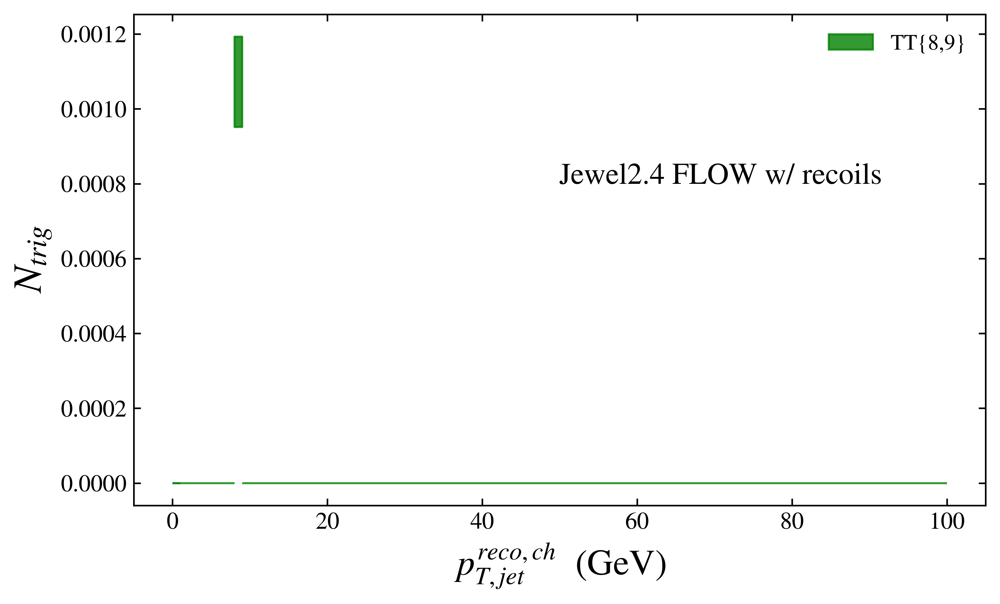

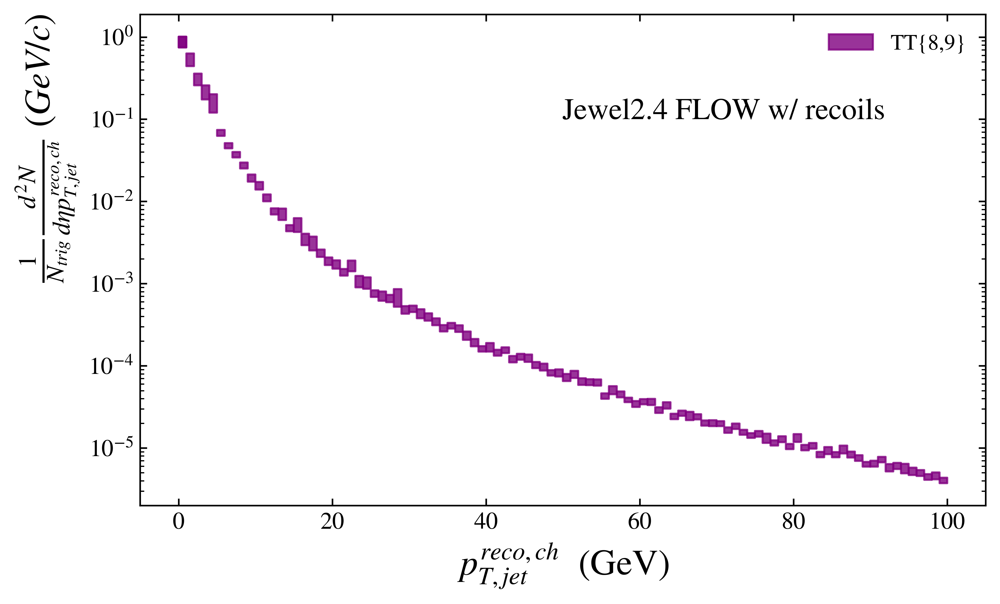

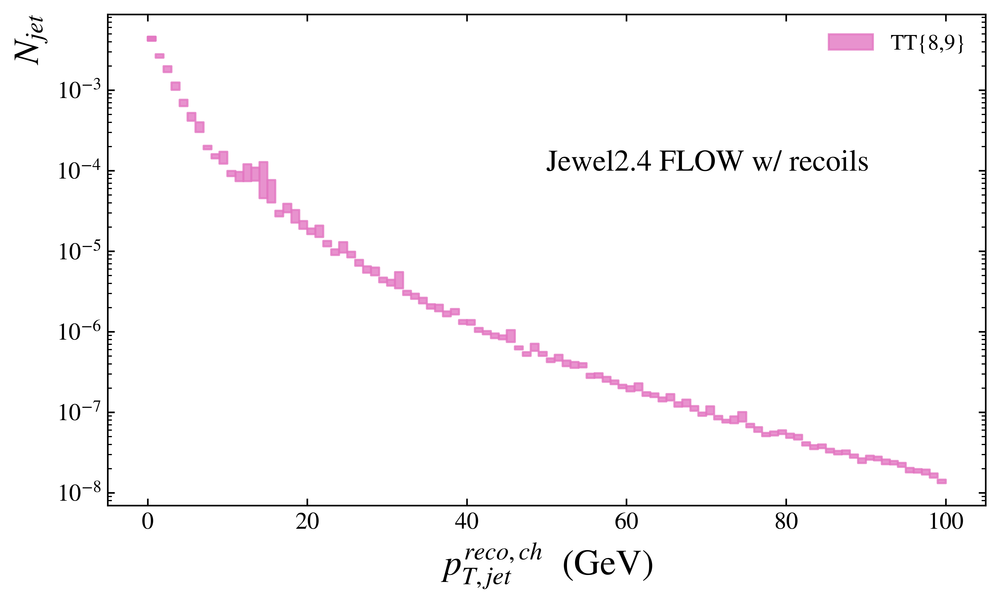

In [58]:
#Gráficos para espectro 8 a 9 
import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'
obs_ntrig = '/SEMIINCLUSIVE_HJET/hNtrig_8_9'
obs_jet = '/SEMIINCLUSIVE_HJET/Njet_8_9'
obs_alljet = '/SEMIINCLUSIVE_HJET/Njet_all_8_9'


histos = yoda.read(output)
    
Ntrig = histos[obs_ntrig]   
Njet = histos[obs_jet]   
Nalljet = histos[obs_alljet]   





x = np.asarray(Ntrig.xVals())
y = np.asarray(Ntrig.yVals())
yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

arr = [x, y, yerr, xerr]

Norm = Ntrig.sumW()
print('Norm factor = ',Norm)




#Njet.rebin(5)
xj = np.asarray(Njet.xVals())
yj = np.asarray(Njet.yVals()/Norm)
yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

arrj = [xj, yj, yerrj, xerrj]

xall = np.asarray(Nalljet.xVals())
yall = np.asarray(Nalljet.yVals()/Norm)
yerrall = np.asarray((Nalljet.yMaxs() - Nalljet.yMins()) / 2*Norm)
xerrall = np.asarray((Nalljet.xMaxs() - Nalljet.xMins()) / 2)

arrall = [xall, yall, yerrall, xerrall]


minpt = 0
# Define plot
plt.figure(1)

for k in range(minpt, arr[0].size):
    xhigh = arr[0][k] + arr[3][k]
    xlow = arr[0][k] - arr[3][k]
    yhigh = arr[1][k] + arr[2][k]
    ylow = arr[1][k] - arr[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='g', label='TT{8,9}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='g')
    plt.legend(frameon = 0)



#plt.errorbar(x, y/Norm, yerr/Norm, xerr, color='g', fmt='o', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{8,9}')
#plt.plot(x, y, color='lightgreen', linestyle='--')



#plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{trig}$')
plt.text(50,0.0008,'Jewel2.4 FLOW w/ recoils')
#plt.ylim(10**(-4),10**(1))
#plt.xlim(5,10)
#plt.title('')


# Save
plt.savefig('Graphs/Ntrig_8_9flowreon.pdf')


# Define plot
plt.figure(2)


for k in range(minpt, arrj[0].size):
    xhigh = arrj[0][k] + arrj[3][k]
    xlow = arrj[0][k] - arrj[3][k]
    yhigh = arrj[1][k] + arrj[2][k]
    ylow = arrj[1][k] - arrj[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='purple', label='TT{8,9}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='purple')
    plt.legend(frameon = 0)



#plt.errorbar(xj, yj, yerrj, xerrj, color='purple', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{8,9}')




plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}~(GeV/c)$', fontsize=18, loc = 'top')
plt.text(50,1E-1,'Jewel2.4 FLOW w/ recoils')
#
#plt.xlim(20,100)
#plt.title('')


# Save
plt.savefig('Graphs/Njet_8_9flowreon.pdf')


# Define plot
plt.figure(3)

for k in range(minpt, arrall[0].size):
    xhigh = arrall[0][k] + arrall[3][k]
    xlow = arrall[0][k] - arrall[3][k]
    yhigh = arrall[1][k] + arrall[2][k]
    ylow = arrall[1][k] - arrall[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{8,9}')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
    plt.legend(frameon = 0)




#plt.errorbar(xallj, yallj, yerrallj, xerrallj, color='hotpink', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{20,50}')



plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{jet}$', fontsize=18, loc = 'top')
plt.text(50,1E-4,'Jewel2.4 FLOW w/ recoils')
plt.legend(frameon = 0)
#plt.text(50,1.,'Jewel2.4 FLOW w/ recoils')

#plt.xlim(20,100)
#plt.title('')


# Save
plt.savefig('Graphs/Nalljet_8_9flowreon.pdf')



Norm factor =  65.29261


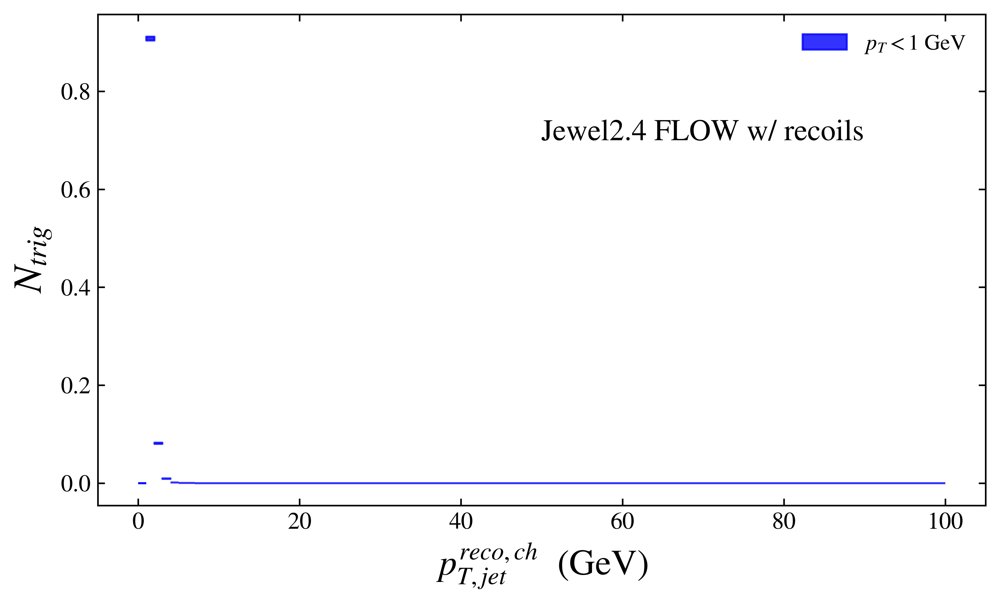

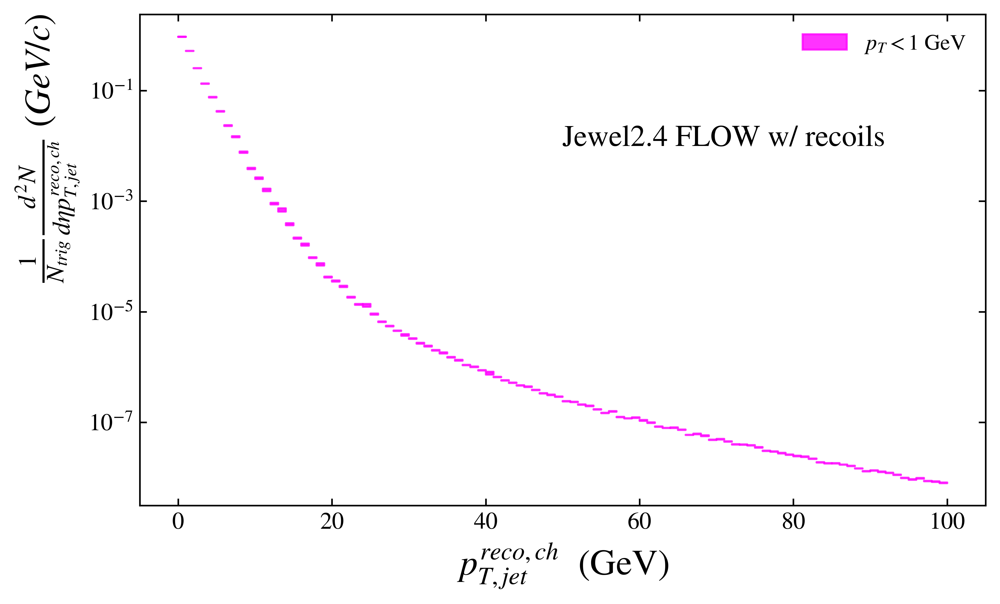

In [81]:
#Gráficos para espectro pt >1 
import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'
obs_ntrig = '/SEMIINCLUSIVE_HJET/hNtrig_1'
obs_jet = '/SEMIINCLUSIVE_HJET/Njet_1'
obs_alljet = '/SEMIINCLUSIVE_HJET/Njet_all_1'


histos = yoda.read(output)
    
Ntrig = histos[obs_ntrig]   
Njet = histos[obs_jet]   
Nalljet = histos[obs_alljet]   





x = np.asarray(Ntrig.xVals())
y = np.asarray(Ntrig.yVals())
yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)



Norm = Ntrig.sumW()
print('Norm factor = ',Norm)

arr = [x, y/Norm, yerr/Norm, xerr]




#Njet.rebin(5)
xj = np.asarray(Njet.xVals())
yj = np.asarray(Njet.yVals()/Norm)
yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

arrj = [xj, yj, yerrj, xerrj]

xall = np.asarray(Nalljet.xVals())
yall = np.asarray(Nalljet.yVals()/Norm)
yerrall = np.asarray((Nalljet.yMaxs() - Nalljet.yMins()) / (2*Norm))
xerrall = np.asarray((Nalljet.xMaxs() - Nalljet.xMins()) / 2)

arrall = [xall, yall, yerrall, xerrall]




# Define plot
plt.figure(1)

for k in range(minpt, arr[0].size):
    xhigh = arr[0][k] + arr[3][k]
    xlow = arr[0][k] - arr[3][k]
    yhigh = arr[1][k] + arr[2][k]
    ylow = arr[1][k] - arr[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='b', label='$p_T < 1$ GeV')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='b')
    plt.legend(frameon = 0)



#plt.errorbar(x, y/Norm, yerr/Norm, xerr, color='b', fmt='o', ms=3, elinewidth = 1., capsize = 2, capthick = 1)
#plt.plot(x, y, color='lightblue', linestyle='--')



#plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{trig}$')
plt.text(50,0.7,'Jewel2.4 FLOW w/ recoils')
#plt.ylim(10**(-6),10**(1))
#plt.xlim(0,50)
#plt.xlim()
#plt.title('')


# Save
plt.savefig('Graphs/Ntrig_1_flowreon.pdf')


# Define plot
plt.figure(2)

for k in range(minpt, arrj[0].size):
    xhigh = arrj[0][k] + arrj[3][k]
    xlow = arrj[0][k] - arrj[3][k]
    yhigh = arrj[1][k] + arrj[2][k]
    ylow = arrj[1][k] - arrj[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='magenta', label='$p_T < 1$ GeV')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='magenta')
    plt.legend(frameon = 0)




#plt.errorbar(xj, yj, yerrj, xerrj, color='magenta', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1)



plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}~(GeV/c)$', fontsize=18, loc = 'top')
plt.text(50,1E-2,'Jewel2.4 FLOW w/ recoils')
#plt.xlim(0,100)
#plt.title('')


# Save
plt.savefig('Graphs/Njet_1_flowreon.pdf')

Norm factor =  549.7075


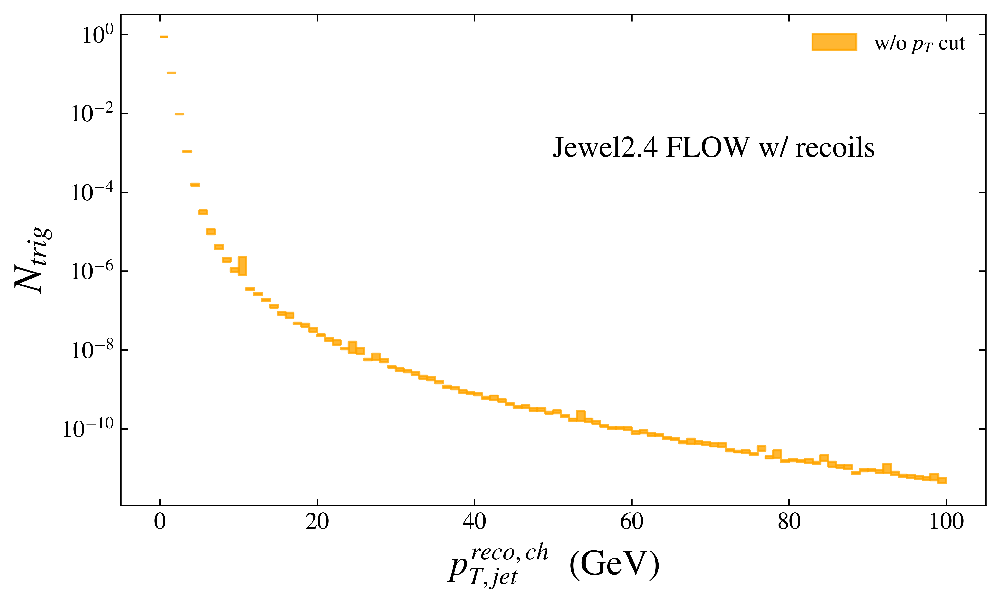

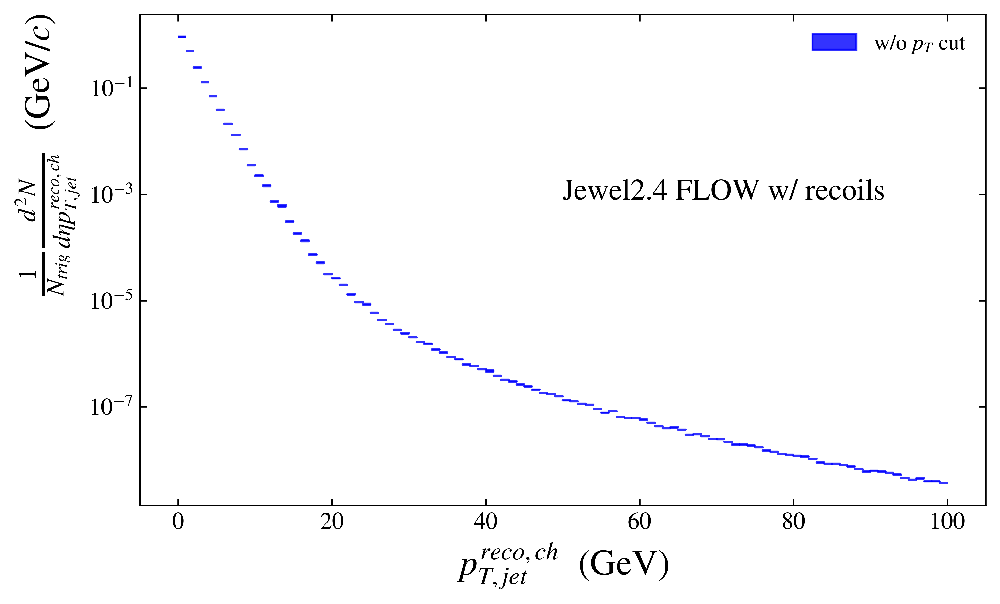

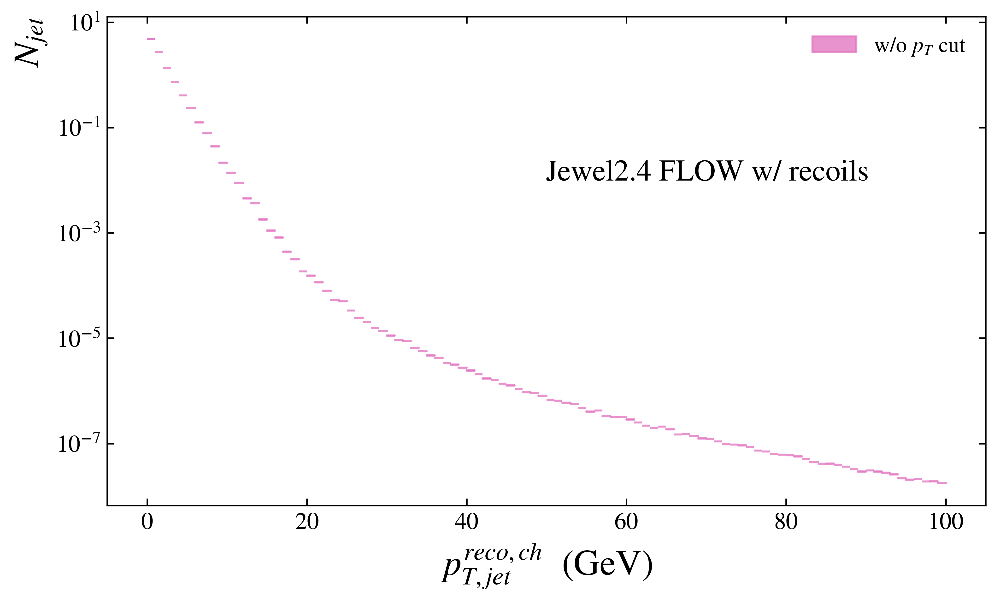

In [85]:
#Gráficos para hjet sem corte de pt para os hádrons triggerados

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'
obs_ntrig = '/SEMIINCLUSIVE_HJET/hNtrig_eta'
obs_jet = '/SEMIINCLUSIVE_HJET/Njet_eta'
obs_alljet = '/SEMIINCLUSIVE_HJET/Njet_all_eta'


histos = yoda.read(output)
    
Ntrig = histos[obs_ntrig]   
Njet = histos[obs_jet]   
Nalljet = histos[obs_alljet]   




x = np.asarray(Ntrig.xVals())
y = np.asarray(Ntrig.yVals())
yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)


Norm = Ntrig.sumW()
print('Norm factor = ',Norm)

arr = [x, y/Norm, yerr/Norm, xerr]


#Njet.rebin(5)
xj = np.asarray(Njet.xVals())
yj = np.asarray(Njet.yVals()/Norm)
yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

arrj = [xj, yj, yerrj, xerrj]


xall = np.asarray(Nalljet.xVals())
yall = np.asarray(Nalljet.yVals()/Norm)
yerrall = np.asarray((Nalljet.yMaxs() - Nalljet.yMins()) / (2*Norm))
xerrall = np.asarray((Nalljet.xMaxs() - Nalljet.xMins()) / 2)


arrall = [xall, yall, yerrall, xerrall]

minpt = 0

# Define plot
plt.figure(1)



for k in range(minpt, arr[0].size):
    xhigh = arr[0][k] + arr[3][k]
    xlow = arr[0][k] - arr[3][k]
    yhigh = arr[1][k] + arr[2][k]
    ylow = arr[1][k] - arr[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='orange', label= 'w/o $p_T$ cut')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='orange')
    plt.legend(frameon = 0)



#plt.errorbar(x, y/Norm, yerr/Norm, xerr, color='orange', fmt='o', ms=3, elinewidth = 1., 
#             capsize = 2, capthick = 1, label = 'without $p_T$ cut')
#plt.plot(x, y, color='bisque', linestyle='--')




plt.yscale('log') 
#plt.xscale('log')
plt.legend(frameon = 0)
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{trig}$')
plt.text(50,0.0008,'Jewel2.4 FLOW w/ recoils')
#plt.ylim(10**(-7),10**(1))
#plt.xlim(0,40)
#plt.title('')


# Save
plt.savefig('Graphs/Ntrig_eta.pdf')


# Define plot
plt.figure(2)


for k in range(minpt, arrj[0].size):
    xhigh = arrj[0][k] + arrj[3][k]
    xlow = arrj[0][k] - arrj[3][k]
    yhigh = arrj[1][k] + arrj[2][k]
    ylow = arrj[1][k] - arrj[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='b', label = 'w/o $p_T$ cut')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='b')
    plt.legend(frameon = 0)





#plt.errorbar(xj, yj, yerrj, xerrj, color='orange', fmt='s', ms=3, elinewidth = 1., capsize = 2, 
#             capthick = 1, label = 'without $p_T$ cut')

#xnew = np.linspace(xj.min(), xj.max(), 200) 

#define spline
#spl = make_interp_spline(xj, yj, k=2)
#y_smooth = spl(xnew)

#create smooth line chart 
#plt.plot(xnew, y_smooth, color='salmon', linestyle='--')


plt.yscale('log') 
#plt.xscale('log')
plt.legend(frameon = 0)
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
           fontsize=18, loc = 'top')
plt.text(50,0.0008,'Jewel2.4 FLOW w/ recoils')
#plt.ylim(10E-8,10E0)
#plt.xlim(0,100)
#plt.title('')


# Save
plt.savefig('Graphs/Njet_eta.pdf')


# Define plot
plt.figure(3)

for k in range(minpt, arrall[0].size):
    xhigh = arrall[0][k] + arrall[3][k]
    xlow = arrall[0][k] - arrall[3][k]
    yhigh = arrall[1][k] + arrall[2][k]
    ylow = arrall[1][k] - arrall[2][k]
    if (k == minpt):
        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='w/o $p_T$ cut')
    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
    plt.legend(frameon = 0)




#plt.errorbar(xallj, yallj, yerrallj, xerrallj, color='hotpink', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1,label = 'TT{20,50}')



plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'$N_{jet}$', fontsize=18, loc = 'top')
plt.text(50,1E-2,'Jewel2.4 FLOW w/ recoils')
plt.legend(frameon = 0)
#plt.text(50,1.,'Jewel2.4 FLOW w/ recoils')

#plt.xlim(20,100)
#plt.title('')


# Save
plt.savefig('Graphs/Nalljet_eta.pdf')



Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_20_50  =  9.848422e-05
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_8_9  =  0.001127919
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_1  =  2.961777
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_eta  =  73.83761


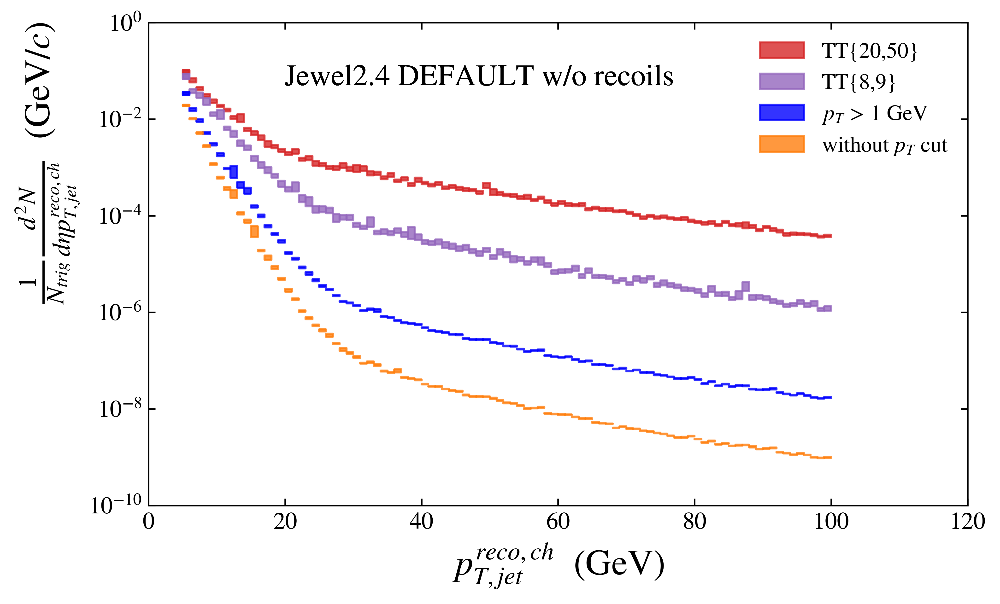

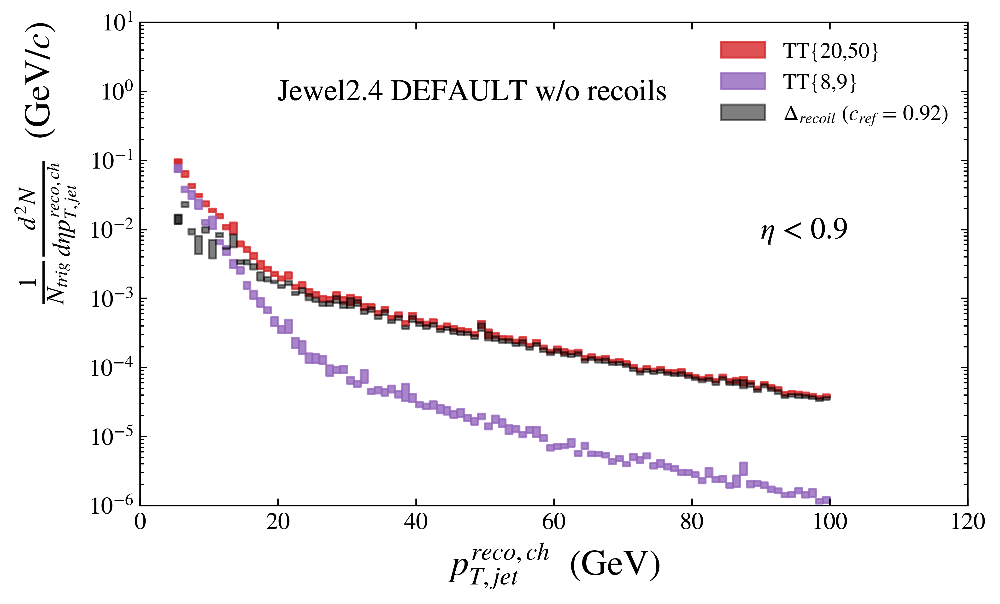

In [56]:
#Gráficos para hjet combinados

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/simple_0303_jewel2.4_hjet_reoff_R0.4.yoda'

obs_ntrig = ['/SEMIINCLUSIVE_HJET/hNtrig_20_50', '/SEMIINCLUSIVE_HJET/hNtrig_8_9',
             '/SEMIINCLUSIVE_HJET/hNtrig_1','/SEMIINCLUSIVE_HJET/hNtrig_eta']

obs_jet = ['/SEMIINCLUSIVE_HJET/Njet_20_50','/SEMIINCLUSIVE_HJET/Njet_8_9',
           '/SEMIINCLUSIVE_HJET/Njet_1','/SEMIINCLUSIVE_HJET/Njet_eta']


histos = yoda.read(output)

minpt = 5

arrj20_50 = []
arrj8_9 = []


for i in range(len(obs_ntrig)):
    
    
    Ntrig = histos[str(obs_ntrig[i])]   
    Njet = histos[str(obs_jet[i])]
    
    x = np.asarray(Ntrig.xVals())
    y = np.asarray(Ntrig.yVals())
    yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
    xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

    
    arr = [x,y,yerr,xerr]
    
    #Norm = (x @ y)
    Norm = Ntrig.sumW() 
    print('Norm factor for ',obs_ntrig[i],' = ',Norm)




    #Njet.rebin(2)
    xj = np.asarray(Njet.xVals())
    yj = np.asarray(Njet.yVals()/Norm)
    yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
    xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

    arrj = [xj,yj,yerrj,xerrj]
    
    
    if (i==0):
        arrj20_50 = arrj
        
    if (i==1):
        arrj8_9 = arrj 
    
    

    # Define plot
    plt.figure(1)
    if (i == 0):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', 
                                 label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            
        #plt.plot(arrj[0], arrj[1], alpha=0.1, color='tab:orange', linestyle='--')

        
        
        #plt.errorbar(xj, yj, yerrj, xerrj, color='red', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1, label = '20 < $p_T$ < 50 GeV')

        #xnew = np.linspace(xj.min(), xj.max(), 200) 

        #define spline
        #spl = make_interp_spline(xj, yj, k=2)
        #y_smooth = spl(xnew)

        #create smooth line chart 
        #plt.plot(xnew, y_smooth, color='lightblue', linestyle='--')
        
    if (i == 1):
        #plt.errorbar(xj, yj, yerrj, xerrj, color='purple', fmt='s', ms=3, elinewidth = 1., capsize = 2, capthick = 1, label = '8 < $p_T$ < 9 GeV' )

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', 
                                 label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
        
        #xnew = np.linspace(xj.min(), xj.max(), 200) 

        #define spline
        #spl = make_interp_spline(xj, yj, k=2)
        #y_smooth = spl(xnew)

        #create smooth line chart 
        #plt.plot(xnew, y_smooth, color='purple', linestyle='--')
        
    if (i == 2):
        #plt.errorbar(xj, yj, yerrj, xerrj, color='magenta', fmt='s', ms=3, elinewidth = 1., capsize = 2, 
        #             capthick = 1, label = '$p_T > 1$ GeV')

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue', 
                                 label='$p_T$ > 1 GeV')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue')

        #xnew = np.linspace(xj.min(), xj.max(), 200) 

        #define spline
        #spl = make_interp_spline(xj, yj, k=2)
        #y_smooth = spl(xnew)

        #create smooth line chart 
        #plt.plot(xnew, y_smooth, color='lightpink', linestyle='--')
        
    if (i == 3):
        #plt.errorbar(xj, yj, yerrj, xerrj, color='orange', fmt='s', ms=3, elinewidth = 1., capsize = 2,
        #             capthick = 1, label = 'without $p_T$ cut')

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', 
                                 label='without $p_T$ cut')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
        
        
        #xnew = np.linspace(xj.min(), xj.max(), 200) 

        #define spline
        #spl = make_interp_spline(xj, yj, k=2)
        #y_smooth = spl(xnew)

        #create smooth line chart 
        #plt.plot(xnew, y_smooth, color='salmon', linestyle='--')
        
        
        
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', fontsize=18, loc = 'top')
    plt.legend(frameon = 0)
    #plt.text(80,0.75E-12,'$\eta$ < 0.9')
    plt.text(20,0.05,'Jewel2.4 DEFAULT w/o recoils')
    plt.ylim(1E-10,1)
    plt.xlim(0,120)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_defaultreoff.pdf')


    # Define second plot
    plt.figure(2)
    if (i == 0):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')

        
       
        
    if (i == 1):
                

        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = arrj8_9[1][k] + arrj8_9[2][k]
            ylow = arrj8_9[1][k] - arrj8_9[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')

        
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute((arrj8_9[1][k] + arrj8_9[2][k])-c*(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute((arrj8_9[1][k] - arrj8_9[2][k])-c*(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black', label='$\Delta_{recoil}$ ($c_{ref}$ = 0.92)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black')






    
    
    
# Define third plot
    
#c = 0.9

#for k in range(minpt, arrj8_9[0].size):
#    xhigh = arrj8_9[0][k] + arrj8_9[3][k]
#    xlow = arrj8_9[0][k] - arrj8_9[3][k]
#    yhigh = np.absolute((arrj8_9[1][k] + arrj8_9[2][k])-c*(arrj20_50[1][k] + arrj20_50[2][k]))
#    ylow = np.absolute((arrj8_9[1][k] - arrj8_9[2][k])-c*(arrj20_50[1][k] - arrj20_50[2][k]))
#    if (k == minpt):
#        plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.2, color='black', label='TT{8,9}-TT{20,50}')
#    plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.2, color='black')

   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', fontsize=18, loc = 'top')
    plt.legend(frameon = 0)
    plt.text(20,0.75,'Jewel2.4 DEFAULT w/o recoils')
    plt.text(90,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,120)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_defaultreoff.pdf')
        



xj_min =  0.5


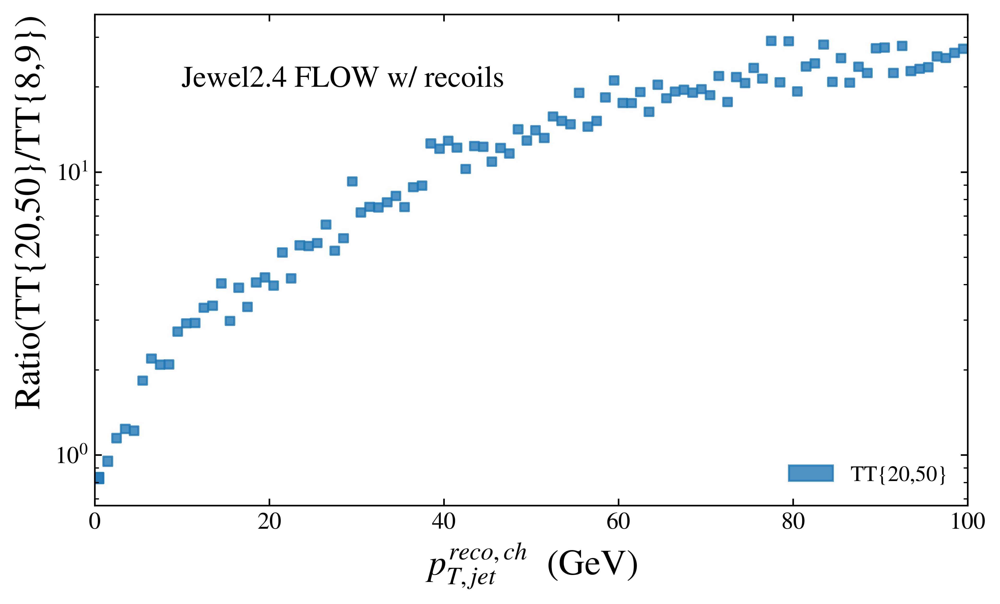

In [4]:
#Gráficos para hjet combinados

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
from scipy import optimize
from scipy.optimize import curve_fit
import warnings
import os

warnings.simplefilter('ignore', np.RankWarning)

plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`



#função para fazer o gráfico dos dados experimentais do ALICE
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]





#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'


obs_ntrig1 = '/SEMIINCLUSIVE_HJET/hNtrig_20_50'

obs_ntrig2 = '/SEMIINCLUSIVE_HJET/hNtrig_8_9'

obs_jet1 = '/SEMIINCLUSIVE_HJET/Njet_20_50'

obs_jet2 = '/SEMIINCLUSIVE_HJET/Njet_8_9'


obs_ntrig3 = '/SEMIINCLUSIVE_HJET/hNtrig_12_50'

obs_ntrig4 = '/SEMIINCLUSIVE_HJET/hNtrig_6_7'

obs_jet3 = '/SEMIINCLUSIVE_HJET/Njet_12_50'

obs_jet4 = '/SEMIINCLUSIVE_HJET/Njet_6_7'



histos = yoda.read(output)

    
    
Ntrig1 = histos[obs_ntrig1]   
Njet1 = histos[obs_jet1]

Ntrig2 = histos[obs_ntrig2]   
Njet2 = histos[obs_jet2]

Ntrig3 = histos[obs_ntrig3]   
Njet3 = histos[obs_jet3]

Ntrig4 = histos[obs_ntrig4]   
Njet4 = histos[obs_jet4]
    

#Norm = (x @ y)
Norm1 = Ntrig1.sumW() 
Norm2 = Ntrig2.sumW()

Norm3 = Ntrig3.sumW() 
Norm4 = Ntrig4.sumW()
    
    

# Suppress/hide the warning
np.seterr(invalid='ignore')
 



#Njet.rebin(2)
xj = np.asarray(Njet1.xVals())

yj1 = np.asarray(Njet1.yVals()/Norm1)
yj2 = np.asarray(Njet2.yVals()/Norm2)

yj = np.asarray((Njet1.yVals()*Norm2) / (Njet2.yVals()*Norm1))




yerrj1 = np.asarray((Njet1.yMaxs() - Njet1.yMins()) / (2*Norm1))
yerrj2 = np.asarray((Njet2.yMaxs() - Njet2.yMins()) / (2*Norm2))


if (yj2.all() != 0):
    yerrj = (1/yj2**2)*yerrj1 / (yj1**2 / yj2**4)*yerrj2
else:
    yerrj = np.asarray((Njet1.yMaxs() - Njet1.yMins()) / (2*Norm1))


xerrj = np.asarray(((Njet1.xMaxs() - Njet1.xMins())) / 2)


arr20 = [xj, yj, yerrj, xerrj]


print('xj_min = ',xj[0])


plt.figure(1)




def best_fit_y(x, a, b):
    return a*x+b



mask = (xj>5.) & (xj<100.)

fit, covariance = optimize.curve_fit(           
        best_fit_y,                                     
        xj[mask],   
        yj[mask])   

#plt.scatter(xj, yj, label="data")

#col =[]
  
#for i in range(len(xj)):
#    if i < 5:
#        col.append('cornflowerblue')
#    else:
#        col.append('b') 

#for i in range(len(xj)):
#    plt.errorbar(xj[i], yj[i], yerrj[i], xerrj[i], fmt=".", color=col[i], ms=3, elinewidth = 1., capsize = 2, capthick = 1)
      

minpt = 0        
for k in range(minpt, arr20[0].size):
    xhigh = arr20[0][k] + arr20[3][k]
    xlow = arr20[0][k] - arr20[3][k]
    yhigh = arr20[1][k] + arr20[2][k]
    ylow = arr20[1][k] - arr20[2][k]
    #if (k < 5):
    if (k == minpt):
                    #plt.fill_between([xlow, xhigh], ylow, 1.07*yhigh, alpha=0.8, color='purple', label='TT{20,50}')
        #plt.fill_between([xlow, xhigh], ylow, 1.07*yhigh, alpha=0.8, color='purple')
    #else:
    #    if (k == 5):
        plt.fill_between([xlow, xhigh], ylow, 1.07*yhigh, alpha=0.8, color='tab:blue', label='TT{20,50}')
    plt.fill_between([xlow, xhigh], ylow, 1.07*yhigh, alpha=0.8, color='tab:blue')
    plt.legend(loc=4, frameon = 0)
        
        
        
        
        
        
    
#plt.errorbar(xj, yj, yerrj, xerrj, color='b', fmt='.', ms=3, 
#             elinewidth = 1., capsize = 2, capthick = 1)


#Plot dos dados experimentais            
ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_12.yoda', '/REF/ALICE_2015_I1376027/d12-x01-y01')

#plt.errorbar(*ALICE, color='tomato', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')            
#plt.legend(loc=4, frameon = 0)
c = (yj[0]+yj[1]+yj[2]+yj[3]) / 4
cerr = (1/4)*(yerrj[0]**2 + yerrj[1]**2+yerrj[2]**2 + yerrj[3]**2)**(1/2)
    



    
    
plt.yscale('log') 
#plt.xscale('log')
plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
plt.ylabel(r'Ratio(TT{20,50}/TT{8,9})', fontsize=18, loc = 'top')
#plt.legend()
plt.text(10,20,'Jewel2.4 FLOW w/ recoils')
#plt.text(5,12,'$c_{ref} = %.3f \pm %.3f$'%(c,cerr), color='purple')
#plt.text(70,2,'$c_{ref} = 0.96 \pm 0.01$', color='tomato')
#plt.ylim(1E0,1E2)
plt.xlim(0,100)
#plt.title('')


# Save
plt.savefig('Graphs/Ratio_20_50_8_9_flowreon.pdf')
 



Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_20_50  =  9.848422e-05
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_8_9  =  0.001127919
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_1  =  2.961777
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_eta  =  73.83761
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_12_50  =  0.0007672362
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_6_7  =  0.0001297247


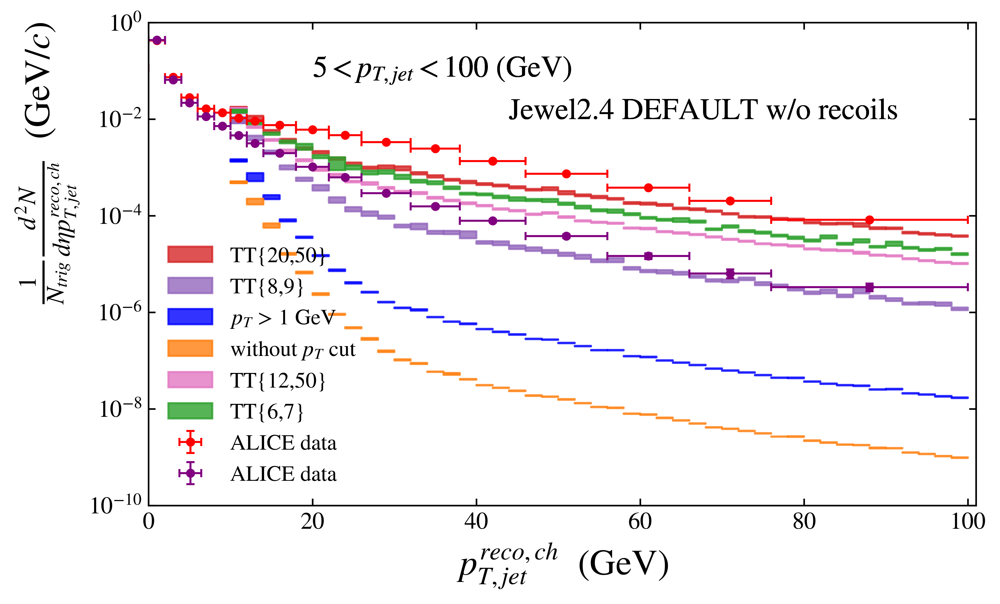

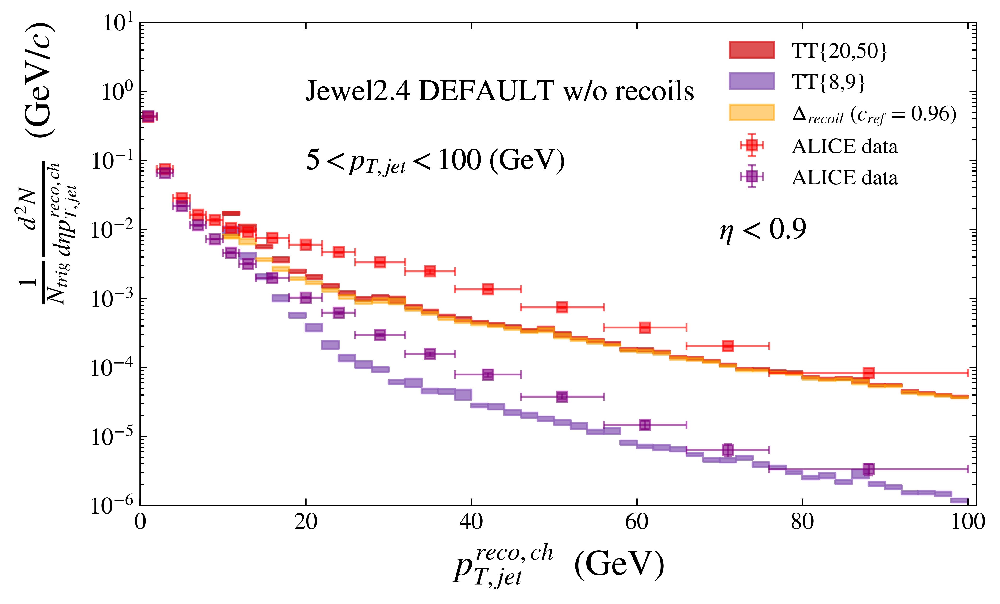

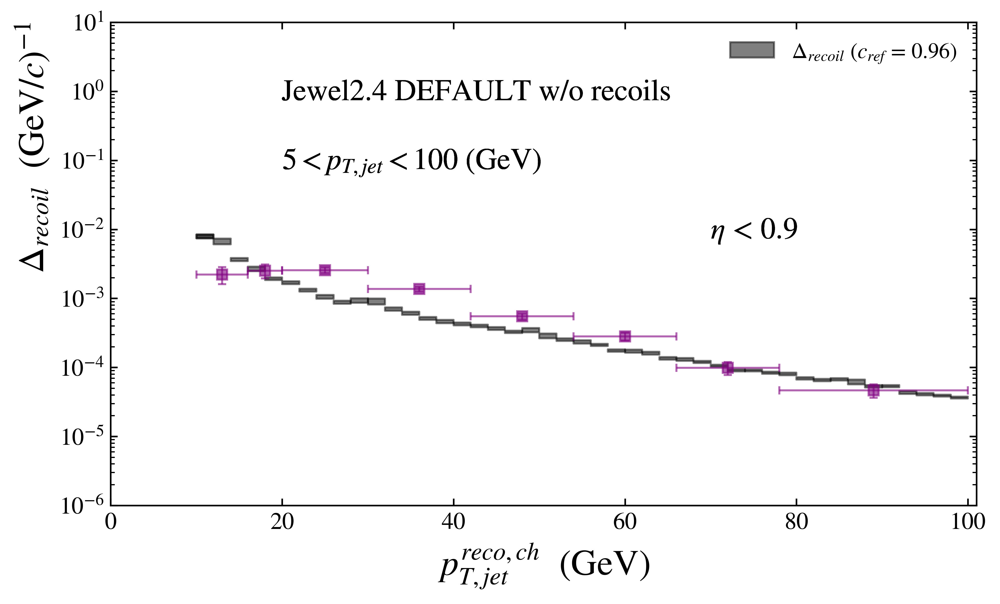

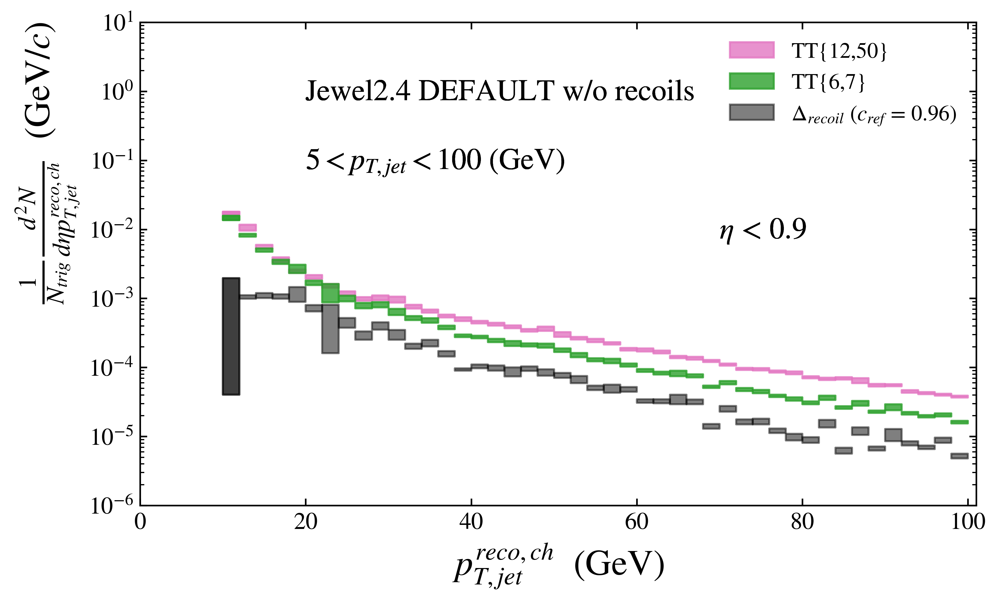

In [21]:
#Gráficos para hjet combinados JEWEL2.4 DEFAULT REOFF

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
#output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/1702_015_jewel2.4_hjet_R0.4.yoda'
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/simple_0303_jewel2.4_hjet_reoff_R0.4.yoda'

#outputreon = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/simple_2702_jewel2.4_hjet_reon_R0.4.yoda'



obs_ntrig = ['/SEMIINCLUSIVE_HJET/hNtrig_20_50', '/SEMIINCLUSIVE_HJET/hNtrig_8_9',
             '/SEMIINCLUSIVE_HJET/hNtrig_1','/SEMIINCLUSIVE_HJET/hNtrig_eta', 
             '/SEMIINCLUSIVE_HJET/hNtrig_12_50', '/SEMIINCLUSIVE_HJET/hNtrig_6_7']

obs_jet = ['/SEMIINCLUSIVE_HJET/Njet_20_50','/SEMIINCLUSIVE_HJET/Njet_8_9',
           '/SEMIINCLUSIVE_HJET/Njet_1','/SEMIINCLUSIVE_HJET/Njet_eta',
          '/SEMIINCLUSIVE_HJET/Njet_12_50', '/SEMIINCLUSIVE_HJET/Njet_6_7']


histos = yoda.read(output)

minpt = 5

arrj20_50 = []
arrj8_9 = []
arrj6_7 = []
arrj12_50 = []


for i in range(len(obs_ntrig)):
    
    
    Ntrig = histos[str(obs_ntrig[i])]   
    Njet = histos[str(obs_jet[i])]
    
    x = np.asarray(Ntrig.xVals())
    y = np.asarray(Ntrig.yVals())
    yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
    xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

    
    arr = [x,y,yerr,xerr]
    
    #Norm = (x @ y)j
    Norm = Ntrig.sumW() 
    print('Norm factor for ',obs_ntrig[i],' = ',Norm)




    Njet.rebin(2)
    xj = np.asarray(Njet.xVals())
    yj = np.asarray(Njet.yVals()/Norm)
    yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
    xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

    arrj = [xj,yj,yerrj,xerrj]
    
    
    if (i==0):
        arrj20_50 = arrj
        
    if (i==1):
        arrj8_9 = arrj
        
    if(i==4):
        arrj12_50 = arrj
        
    if(i==5):
        arrj6_7 = arrj
    
    

    # Define plot
    plt.figure(1)
    if (i == 0):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            plt.legend(loc=3,frameon = 0)
            
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')
        plt.legend(ncol=2,frameon = 0)

        
    if (i == 1):

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(loc=3,frameon = 0)
        
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')
        plt.legend(ncol=2,frameon = 0)
        
    if (i == 2):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue', 
                                 label='$p_T$ > 1 GeV')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue')
            plt.legend(loc=3,frameon = 0)

        #xnew = np.linspace(xj.min(), xj.max(), 200) 

        #define spline
        #spl = make_interp_spline(xj, yj, k=2)
        #y_smooth = spl(xnew)

        #create smooth line chart 
        #plt.plot(xnew, y_smooth, color='lightpink', linestyle='--')
        
    if (i == 3):
        #plt.errorbar(xj, yj, yerrj, xerrj, color='orange', fmt='s', ms=3, elinewidth = 1., capsize = 2,
        #             capthick = 1, label = 'without $p_T$ cut')

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', 
                                 label='without $p_T$ cut')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
            plt.legend(loc=3,frameon = 0)
        
        
    if (i == 4):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', 
                                 label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(loc=3,frameon = 0)

            
    if (i == 5):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', 
                                 label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
            plt.legend(loc=3,frameon = 0)
        
        
 
        
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(44,0.01,'Jewel2.4 DEFAULT w/o recoils')
    #plt.text(80,0.75E-12,'$\eta$ < 0.9')
    plt.ylim(1E-10,1)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_defaultreoff.pdf')


    # Define second plot
    plt.figure(2)
    if (i == 0):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            plt.legend(frameon = 0)
        
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='s', ms=5, elinewidth = 1., capsize = 2, capthick = 1, alpha=0.6, label='ALICE data')
        plt.legend(ncol=2,frameon = 0)

        
       
        
    if (i == 1):
                

        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = arrj8_9[1][k] + arrj8_9[2][k]
            ylow = arrj8_9[1][k] - arrj8_9[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(frameon = 0)
        
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=5, elinewidth = 1., capsize = 2, capthick = 1, alpha=0.6, label='ALICE data')
        plt.legend(ncol=2,frameon = 0)

        
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute(-c*(arrj8_9[1][k] + arrj8_9[2][k])+(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute(-c*(arrj8_9[1][k] - arrj8_9[2][k])+(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(frameon = 0)






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 DEFAULT w/o recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_2050defaultreoff.pdf')
    
    plt.figure(3)
    if (i == 1):
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute(-c*(arrj8_9[1][k] + arrj8_9[2][k])+(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute(-c*(arrj8_9[1][k] - arrj8_9[2][k])+(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black')
            plt.legend(frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_18.yoda', '/REF/ALICE_2015_I1376027/d18-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=5, elinewidth = 1., capsize = 2, capthick = 1, alpha=0.6, label='ALICE data')
        #plt.legend(ncol=2,frameon = 0)
        
       



    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\Delta_{recoil}$' '  (GeV/$c$)$^{-1}$', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 DEFAULT w/o recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Delta_2050defaultreoff.pdf')
        
    
    # Define second plot
    plt.figure(4)
    if (i == 4):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(frameon = 0)

        
       
        
    if (i == 5):
                

        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = arrj6_7[1][k] + arrj6_7[2][k]
            ylow = arrj6_7[1][k] - arrj6_7[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
            plt.legend(frameon = 0)

        
        c = 0.96
        
        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = np.absolute(-c*(arrj6_7[1][k] + arrj6_7[2][k])+(arrj12_50[1][k] + arrj12_50[2][k]))
            ylow = np.absolute(-c*(arrj6_7[1][k] - arrj6_7[2][k])+(arrj12_50[1][k] - arrj12_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black')
            plt.legend(frameon = 0)






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 DEFAULT w/o recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb1250_defaultreoff.pdf')
        

        


Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_20_50  =  9.704697e-05
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_8_9  =  0.001076593
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_1  =  45.91695
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_eta  =  587.6806
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_12_50  =  0.0007347944
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_6_7  =  0.0001507612


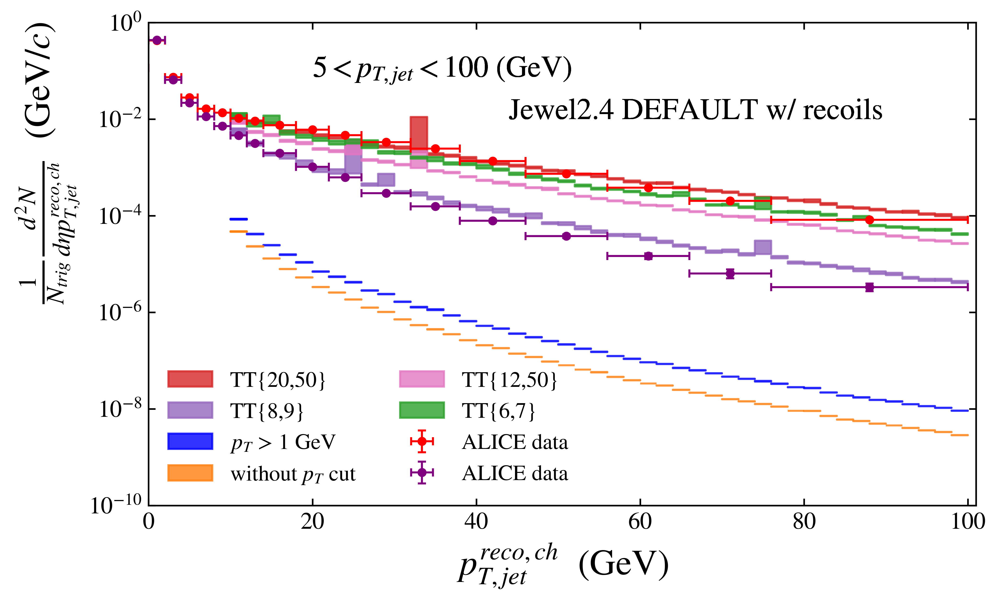

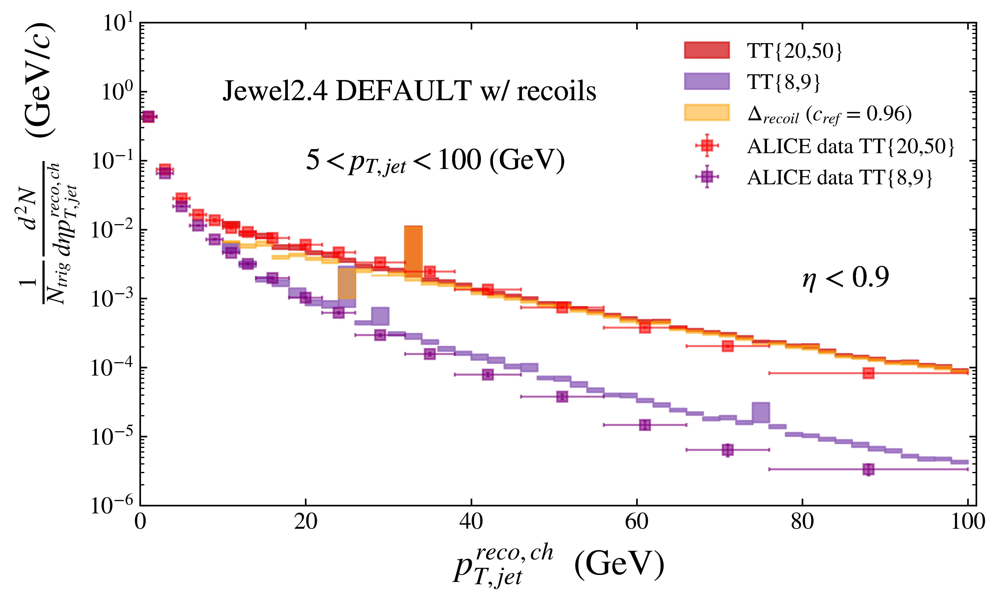

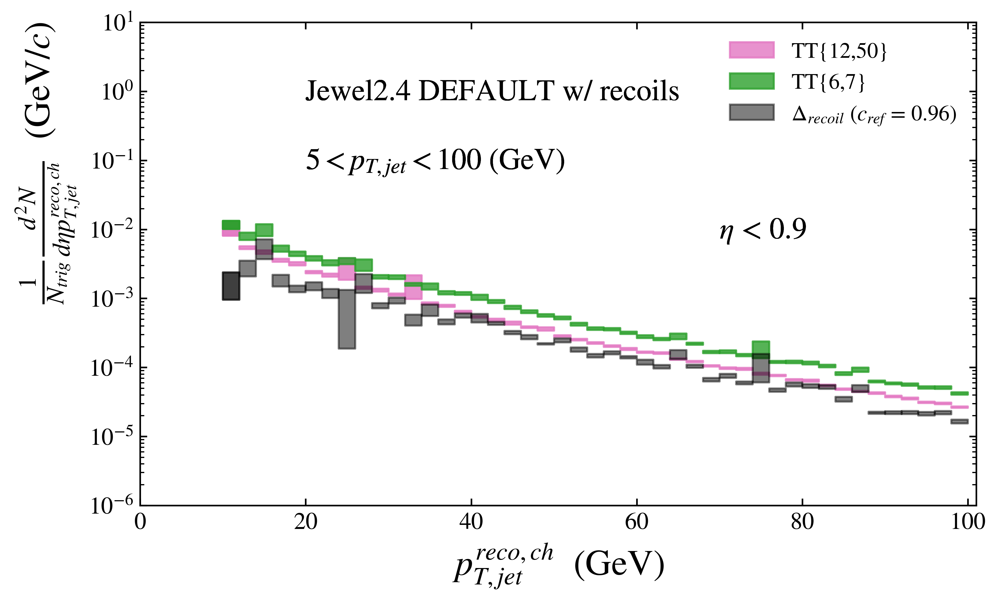

In [17]:
#Gráficos para hjet combinados JEWEL2.4 DEFAULT REON

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')




#função para fazer o gráfico dos dados experimentais do ALICE
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
#output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/simple_2702_jewel2.4_hjet_reoff_R0.4.yoda'
outputreon = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/simple_0303_jewel2.4_hjet_reon_R0.4.yoda'



obs_ntrig = ['/SEMIINCLUSIVE_HJET/hNtrig_20_50', '/SEMIINCLUSIVE_HJET/hNtrig_8_9',
             '/SEMIINCLUSIVE_HJET/hNtrig_1','/SEMIINCLUSIVE_HJET/hNtrig_eta', 
             '/SEMIINCLUSIVE_HJET/hNtrig_12_50', '/SEMIINCLUSIVE_HJET/hNtrig_6_7']

obs_jet = ['/SEMIINCLUSIVE_HJET/Njet_20_50','/SEMIINCLUSIVE_HJET/Njet_8_9',
           '/SEMIINCLUSIVE_HJET/Njet_1','/SEMIINCLUSIVE_HJET/Njet_eta',
          '/SEMIINCLUSIVE_HJET/Njet_12_50', '/SEMIINCLUSIVE_HJET/Njet_6_7']


histos = yoda.read(outputreon)

minpt = 5

arrj20_50 = []
arrj8_9 = []
arrj12_50 = []
arrj6_7 = []


for i in range(len(obs_ntrig)):
    
    
    Ntrig = histos[str(obs_ntrig[i])]   
    Njet = histos[str(obs_jet[i])]
    
    x = np.asarray(Ntrig.xVals())
    y = np.asarray(Ntrig.yVals())
    yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
    xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

    
    arr = [x,y,yerr,xerr]
    
    #Norm = (x @ y)
    Norm = Ntrig.sumW() 
    print('Norm factor for ',obs_ntrig[i],' = ',Norm)




    Njet.rebin(2)
    xj = np.asarray(Njet.xVals())
    yj = np.asarray(Njet.yVals()/Norm)
    yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
    xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

    arrj = [xj,yj,yerrj,xerrj]
    
    
    if (i==0):
        arrj20_50 = arrj
        
    if (i==1):
        arrj8_9 = arrj 
        
    if (i==4):
        arrj12_50 = arrj
        
    if (i==5):
        arrj6_7 = arrj 
    
    

    # Define plot
    plt.figure(1)
    if (i == 0):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            
            plt.legend(ncol=2,frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')            
        plt.legend(ncol=2,frameon = 0)
            

        
    if (i == 1):

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(ncol=2,frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')
        plt.legend(ncol=2,frameon = 0)

        

        
    if (i == 2):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue', 
                                 label='$p_T$ > 1 GeV')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue')
            plt.legend(ncol=2,frameon = 0)

 
    if (i == 3):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', 
                                 label='without $p_T$ cut')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
            plt.legend(ncol=2,frameon = 0)
        
        
    if (i == 4):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', 
                                 label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(ncol=2,frameon = 0)

            
    if (i == 5):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', 
                                 label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
    
            plt.legend(ncol=2,frameon = 0)
        
        
     
    
    
  
        
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(44,0.01,'Jewel2.4 DEFAULT w/ recoils')
    #plt.text(80,0.75E-12,'$\eta$ < 0.9')
    plt.ylim(1E-10,1)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_defaultreon.pdf')


    # Define second plot
    plt.figure(2)
    if (i == 0):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            plt.legend(frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='s', ms=5, elinewidth = 1., capsize = 1, capthick = 1, alpha = 0.6, label='ALICE data TT{20,50}')            


        
       
        
    if (i == 1):
                

        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = arrj8_9[1][k] + arrj8_9[2][k]
            ylow = arrj8_9[1][k] - arrj8_9[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(frameon = 0)
            

            

        
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute(-c*(arrj8_9[1][k] + arrj8_9[2][k])+(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute(-c*(arrj8_9[1][k] - arrj8_9[2][k])+(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(frameon = 0)
            
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=5, elinewidth = 1., capsize = 1, capthick = 1, alpha = 0.6, label='ALICE data TT{8,9}')            
        plt.legend(frameon = 0)
        






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(10,0.75,'Jewel2.4 DEFAULT w/ recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(80,1.5E-3,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_2050defaultreon.pdf')
    plt.savefig('Graphs/Njet_comb_2050defaultreon.png')
    
    
    
    # Define second plot
    plt.figure(3)
    if (i == 4):
    

        for k in range(minpt, arrj12_50[0].size):
            xhigh = arrj12_50[0][k] + arrj12_50[3][k]
            xlow = arrj12_50[0][k] - arrj12_50[3][k]
            yhigh = arrj12_50[1][k] + arrj12_50[2][k]
            ylow = arrj12_50[1][k] - arrj12_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(frameon = 0)

        
       
        
    if (i == 5):
                

        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = arrj6_7[1][k] + arrj6_7[2][k]
            ylow = arrj6_7[1][k] - arrj6_7[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
            plt.legend(frameon = 0)

        
        c = 0.96
        
        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = np.absolute((arrj6_7[1][k] + arrj6_7[2][k])-c*(arrj12_50[1][k] + arrj12_50[2][k]))
            ylow = np.absolute((arrj6_7[1][k] - arrj6_7[2][k])-c*(arrj12_50[1][k] - arrj12_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='black')
            plt.legend(frameon = 0)






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 DEFAULT w/ recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_1250defaultreon.pdf')
        

        

Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_20_50  =  7.400126e-05
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_8_9  =  0.001072307
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_1  =  65.29261
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_eta  =  549.7075
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_12_50  =  0.0005470744
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_6_7  =  0.0001270487


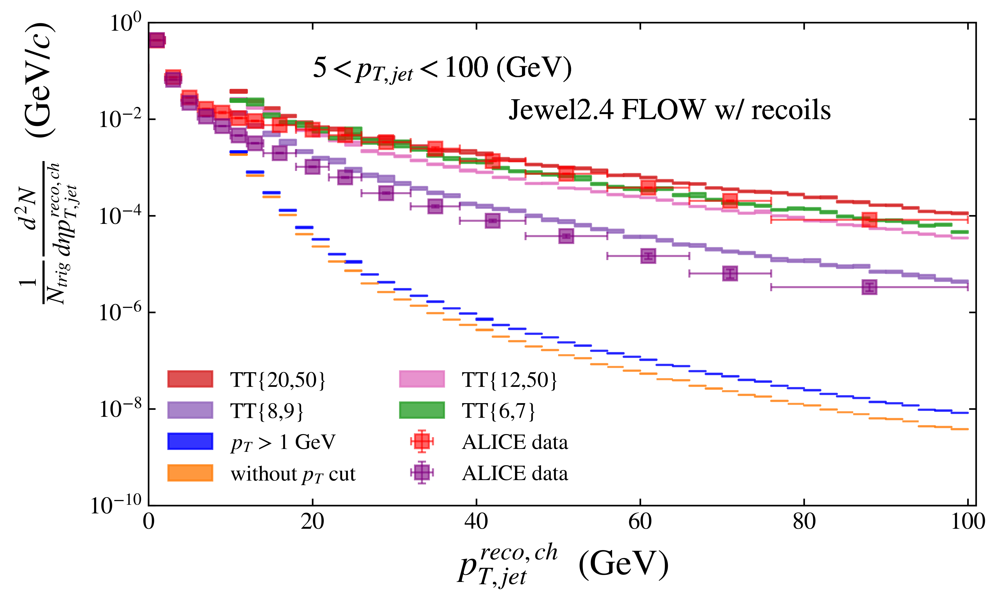

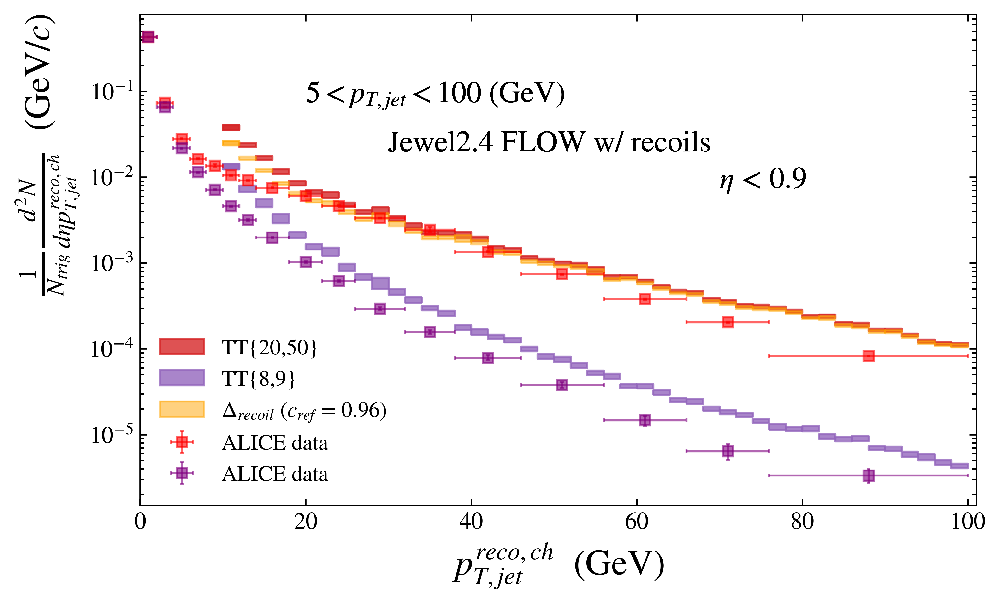

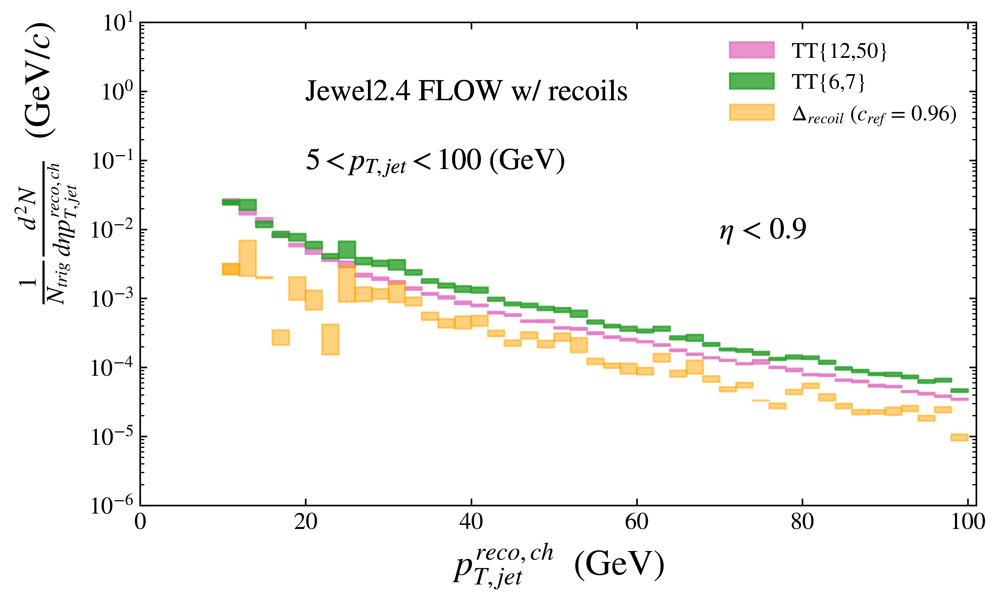

In [18]:
#Gráficos para hjet combinados JEWEL2.4 FLOW REON

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')




#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
outputreon = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reon_R0.4.yoda'



obs_ntrig = ['/SEMIINCLUSIVE_HJET/hNtrig_20_50', '/SEMIINCLUSIVE_HJET/hNtrig_8_9',
             '/SEMIINCLUSIVE_HJET/hNtrig_1','/SEMIINCLUSIVE_HJET/hNtrig_eta', 
             '/SEMIINCLUSIVE_HJET/hNtrig_12_50', '/SEMIINCLUSIVE_HJET/hNtrig_6_7']

obs_jet = ['/SEMIINCLUSIVE_HJET/Njet_20_50','/SEMIINCLUSIVE_HJET/Njet_8_9',
           '/SEMIINCLUSIVE_HJET/Njet_1','/SEMIINCLUSIVE_HJET/Njet_eta',
          '/SEMIINCLUSIVE_HJET/Njet_12_50', '/SEMIINCLUSIVE_HJET/Njet_6_7']


histos = yoda.read(outputreon)

minpt = 5

arrj20_50 = []
arrj8_9 = []
arrj12_50 = []
arrj6_7 = []


for i in range(len(obs_ntrig)):
    
    
    Ntrig = histos[str(obs_ntrig[i])]   
    Njet = histos[str(obs_jet[i])]
    
    x = np.asarray(Ntrig.xVals())
    y = np.asarray(Ntrig.yVals())
    yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
    xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

    
    arr = [x,y,yerr,xerr]
    
    #Norm = (x @ y)
    Norm = Ntrig.sumW() 
    print('Norm factor for ',obs_ntrig[i],' = ',Norm)




    Njet.rebin(2)
    xj = np.asarray(Njet.xVals())
    yj = np.asarray(Njet.yVals()/Norm)
    yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
    xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

    arrj = [xj,yj,yerrj,xerrj]
    
    
    if (i==0):
        arrj20_50 = arrj
        
    if (i==1):
        arrj8_9 = arrj 
        
    if (i==4):
        arrj12_50 = arrj
        
    if (i==5):
        arrj6_7 = arrj 
    
    

    # Define plot
    plt.figure(1)
    if (i == 0):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            
            plt.legend(ncol=2, frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='s', ms=7, elinewidth = 1., capsize = 2, capthick = 1, alpha = 0.6, label='ALICE data')            

            

        
    if (i == 1):

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(ncol=2, frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=7, elinewidth = 1., capsize = 2, capthick = 1, alpha = 0.6, label='ALICE data')            

        

        
    if (i == 2):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue', 
                                 label='$p_T$ > 1 GeV')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue')
            plt.legend(ncol=2, frameon = 0)

 
    if (i == 3):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', 
                                 label='without $p_T$ cut')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
            plt.legend(ncol=2, frameon = 0)
        
        
    if (i == 4):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', 
                                 label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(ncol=2, frameon = 0)

            
    if (i == 5):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', 
                                 label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
    
            plt.legend(ncol=2, frameon = 0)
        
        
     
    
    
  
        
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    #plt.text(80,0.75E-12,'$\eta$ < 0.9')
    plt.text(44,0.01,'Jewel2.4 FLOW w/ recoils')
    plt.ylim(1E-10,1)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_flowreon.pdf')


    # Define second plot
    plt.figure(2)
    if (i == 0):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            plt.legend(loc=3,frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='s', ms=5, elinewidth = 1., capsize = 1, capthick = 1, alpha = 0.6, label='ALICE data')            


        
       
        
    if (i == 1):
                

        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = arrj8_9[1][k] + arrj8_9[2][k]
            ylow = arrj8_9[1][k] - arrj8_9[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(loc=3,frameon = 0)
            

            

        
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute(-c*(arrj8_9[1][k] + arrj8_9[2][k])+(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute(-c*(arrj8_9[1][k] - arrj8_9[2][k])+(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(loc=3,frameon = 0)
            
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=5, elinewidth = 1., capsize = 1, capthick = 1, alpha = 0.6, label='ALICE data')            
        plt.legend(loc=3,frameon = 0)
        






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(30,0.02,'Jewel2.4 FLOW w/ recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    #plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_2050flowreon.pdf')
    
    
    
    # Define second plot
    plt.figure(3)
    if (i == 4):
    

        for k in range(minpt, arrj12_50[0].size):
            xhigh = arrj12_50[0][k] + arrj12_50[3][k]
            xlow = arrj12_50[0][k] - arrj12_50[3][k]
            yhigh = arrj12_50[1][k] + arrj12_50[2][k]
            ylow = arrj12_50[1][k] - arrj12_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(frameon = 0)

        
       
        
    if (i == 5):
                

        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = arrj6_7[1][k] + arrj6_7[2][k]
            ylow = arrj6_7[1][k] - arrj6_7[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
            plt.legend(frameon = 0)

        
        c = 0.96
        
        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = np.absolute(-c*(arrj6_7[1][k] + arrj6_7[2][k])+(arrj12_50[1][k] + arrj12_50[2][k]))
            ylow = np.absolute(-c*(arrj6_7[1][k] - arrj6_7[2][k])+(arrj12_50[1][k] - arrj12_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(frameon = 0)






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 FLOW w/ recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_1250flowreon.pdf')
        

        

Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_20_50  =  8.909201e-05
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_8_9  =  0.001198207
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_1  =  3.48927
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_eta  =  75.63916
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_12_50  =  0.0007215413
Norm factor for  /SEMIINCLUSIVE_HJET/hNtrig_6_7  =  0.0001193969


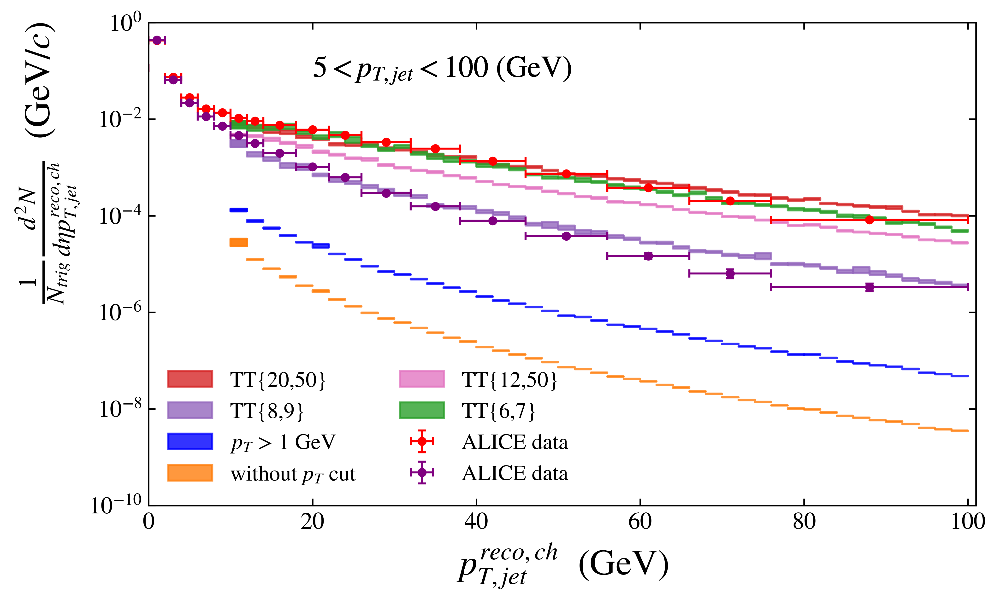

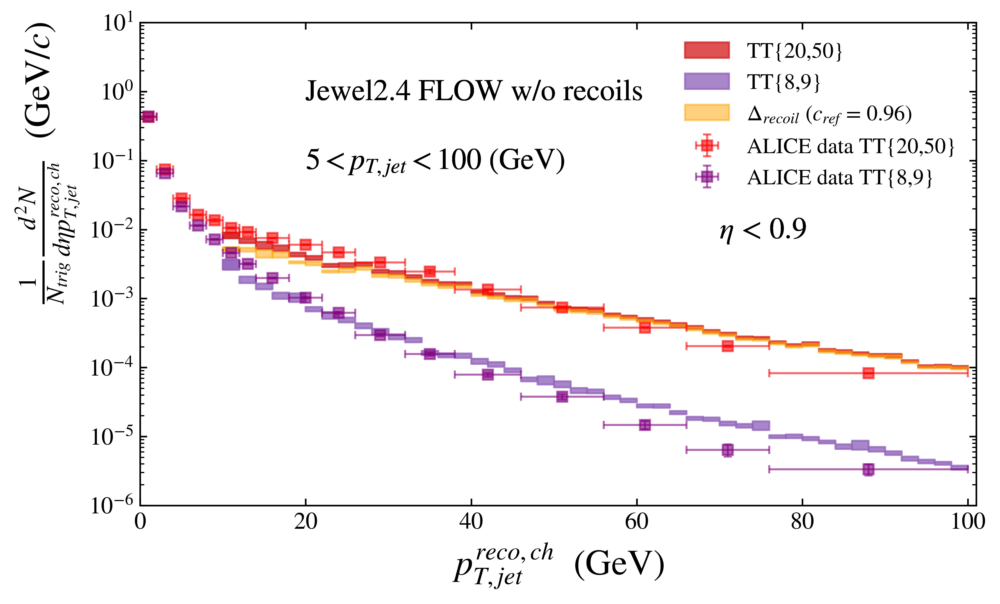

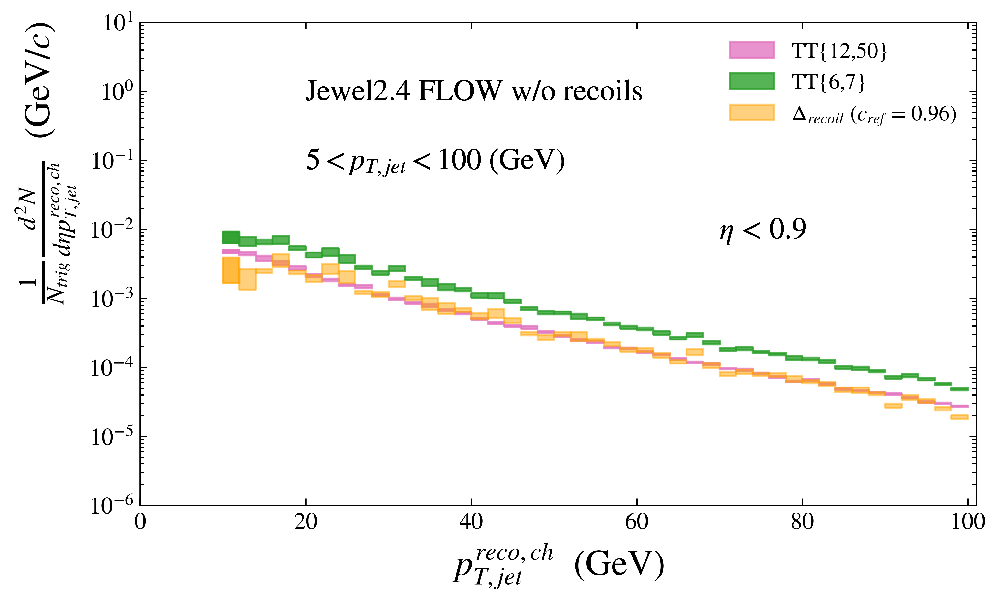

In [19]:
#Gráficos para hjet combinados JEWEL2.4 FLOW REOFF

import yoda
import matplotlib.pyplot as plt
import math
import numpy as np
import scipy as sc
from matplotlib.ticker import AutoMinorLocator
from scipy.interpolate import make_interp_spline, BSpline

import os



plt.style.use('plotconfig.mplstyle')




#função para fazer o gráfico dos dados experimentais do ATLAS
def DataFromExperiment(file, scatter, min = 0, max = 0):
    '''
    Grab data from the Yoda.Scatter2D named scatter from the file yoda, following
    the method that colaborations (ALICE, ATLAS, CMS) save them.

    (str, str) -> (list(np.array))
    '''
    data = yoda.read(file)[scatter]

    if max == 0:
        max = len(data.xVals()) + 1

    x = np.asarray(data.xVals())[min:max]
    y = np.asarray(data.yVals())[min:max]
    err = np.asarray((data.yMaxs() - data.yMins()) / 2)[min:max]
    errx = np.asarray((data.xMaxs() - data.xMins()) / 2)[min:max]
    return [x, y, err, errx]


# Useful documentation:
# YODA: https://yoda.hepforge.org/pydoc/
# MATPLOTLIB: https://matplotlib.org/
# NUMPY: https://numpy.org/doc/

# Don't forget to load necessary packages in SAMPA
# source /cvmfs/alice.cern.ch/etc/login.sh
# eval `alienv printenv VO_ALICE@Rivet::2.7.2-alice2-1`




#Diretorio para yoda file
output = '/home/monalisa/Desktop/Mestrado/semi-inclusive+h-jet/Matplotlib_hjet/yoda_merge/flow_2802_jewel2.4_hjet_reoff_R0.4.yoda'



obs_ntrig = ['/SEMIINCLUSIVE_HJET/hNtrig_20_50', '/SEMIINCLUSIVE_HJET/hNtrig_8_9',
             '/SEMIINCLUSIVE_HJET/hNtrig_1','/SEMIINCLUSIVE_HJET/hNtrig_eta', 
             '/SEMIINCLUSIVE_HJET/hNtrig_12_50', '/SEMIINCLUSIVE_HJET/hNtrig_6_7']

obs_jet = ['/SEMIINCLUSIVE_HJET/Njet_20_50','/SEMIINCLUSIVE_HJET/Njet_8_9',
           '/SEMIINCLUSIVE_HJET/Njet_1','/SEMIINCLUSIVE_HJET/Njet_eta',
          '/SEMIINCLUSIVE_HJET/Njet_12_50', '/SEMIINCLUSIVE_HJET/Njet_6_7']


histos = yoda.read(output)

minpt = 5

arrj20_50 = []
arrj8_9 = []
arrj12_50 = []
arrj6_7 = []


for i in range(len(obs_ntrig)):
    
    
    Ntrig = histos[str(obs_ntrig[i])]   
    Njet = histos[str(obs_jet[i])]
    
    x = np.asarray(Ntrig.xVals())
    y = np.asarray(Ntrig.yVals())
    yerr = np.asarray((Ntrig.yMaxs() - Ntrig.yMins()) / 2)
    xerr = np.asarray((Ntrig.xMaxs() - Ntrig.xMins()) / 2)

    
    arr = [x,y,yerr,xerr]
    
    #Norm = (x @ y)
    Norm = Ntrig.sumW() 
    print('Norm factor for ',obs_ntrig[i],' = ',Norm)




    Njet.rebin(2)
    xj = np.asarray(Njet.xVals())
    yj = np.asarray(Njet.yVals()/Norm)
    yerrj = np.asarray((Njet.yMaxs() - Njet.yMins()) / (2*Norm))
    xerrj = np.asarray((Njet.xMaxs() - Njet.xMins()) / 2)

    arrj = [xj,yj,yerrj,xerrj]
    
    
    if (i==0):
        arrj20_50 = arrj
        
    if (i==1):
        arrj8_9 = arrj 
        
    if (i==4):
        arrj12_50 = arrj
        
    if (i==5):
        arrj6_7 = arrj 
    
    

    # Define plot
    plt.figure(1)
    if (i == 0):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            
            plt.legend(ncol=2,frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')            

            

        
    if (i == 1):

        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(ncol=2,frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='.', ms=7, elinewidth = 1., capsize = 2, capthick = 1, label='ALICE data')            

        

        
    if (i == 2):
        
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue', 
                                 label='$p_T$ > 1 GeV')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='blue')
            plt.legend(ncol=2,frameon = 0)

 
    if (i == 3):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange', 
                                 label='without $p_T$ cut')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:orange')
            plt.legend(ncol=2,frameon = 0)
        
        
    if (i == 4):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', 
                                 label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(ncol=2,frameon = 0)

            
    if (i == 5):
 
        for k in range(minpt, arrj[0].size):
            xhigh = arrj[0][k] + arrj[3][k]
            xlow = arrj[0][k] - arrj[3][k]
            yhigh = arrj[1][k] + arrj[2][k]
            ylow = arrj[1][k] - arrj[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', 
                                 label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
    
            plt.legend(ncol=2,frameon = 0)
        
        
     
    
    
  
        
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    #plt.text(80,0.75E-12,'$\eta$ < 0.9')
    plt.ylim(1E-10,1)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_flowreoff.pdf')


    # Define second plot
    plt.figure(2)
    if (i == 0):
    

        for k in range(minpt, arrj20_50[0].size):
            xhigh = arrj20_50[0][k] + arrj20_50[3][k]
            xlow = arrj20_50[0][k] - arrj20_50[3][k]
            yhigh = arrj20_50[1][k] + arrj20_50[2][k]
            ylow = arrj20_50[1][k] - arrj20_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red', label='TT{20,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:red')
            plt.legend(frameon = 0)
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_4_TT2050.yoda', '/REF/ALICE_2015_I1376027/d04-x01-y01')

        plt.errorbar(*ALICE, color='r', fmt='s', ms=5, elinewidth = 1., capsize = 2, capthick = 1, alpha = 0.6, label='ALICE data TT{20,50}')            


        
       
        
    if (i == 1):
                

        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = arrj8_9[1][k] + arrj8_9[2][k]
            ylow = arrj8_9[1][k] - arrj8_9[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple', label='TT{8,9}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:purple')
            plt.legend(frameon = 0)
            

            

        
        c = 0.96
        
        for k in range(minpt, arrj8_9[0].size):
            xhigh = arrj8_9[0][k] + arrj8_9[3][k]
            xlow = arrj8_9[0][k] - arrj8_9[3][k]
            yhigh = np.absolute(-c*(arrj8_9[1][k] + arrj8_9[2][k])+(arrj20_50[1][k] + arrj20_50[2][k]))
            ylow = np.absolute(-c*(arrj8_9[1][k] - arrj8_9[2][k])+(arrj20_50[1][k] - arrj20_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(frameon = 0)
            
            
        #Plot dos dados experimentais            
        ALICE = DataFromExperiment('HEPData/HEPData-ins1376027-v1-Table_3_TT89.yoda', '/REF/ALICE_2015_I1376027/d03-x01-y01')

        plt.errorbar(*ALICE, color='purple', fmt='s', ms=5, elinewidth = 1., capsize = 2, capthick = 1, alpha = 0.6, label='ALICE data TT{8,9}')            
        plt.legend(frameon = 0)
        






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 FLOW w/o recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_2050flowreoff.pdf')
    plt.savefig('Graphs/Njet_comb_2050flowreoff.png')
    
    
    
    # Define second plot
    plt.figure(3)
    if (i == 4):
    

        for k in range(minpt, arrj12_50[0].size):
            xhigh = arrj12_50[0][k] + arrj12_50[3][k]
            xlow = arrj12_50[0][k] - arrj12_50[3][k]
            yhigh = arrj12_50[1][k] + arrj12_50[2][k]
            ylow = arrj12_50[1][k] - arrj12_50[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink', label='TT{12,50}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:pink')
            plt.legend(frameon = 0)

        
       
        
    if (i == 5):
                

        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = arrj6_7[1][k] + arrj6_7[2][k]
            ylow = arrj6_7[1][k] - arrj6_7[2][k]
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green', label='TT{6,7}')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.8, color='tab:green')
            plt.legend(frameon = 0)

        
        c = 0.96
        
        for k in range(minpt, arrj6_7[0].size):
            xhigh = arrj6_7[0][k] + arrj6_7[3][k]
            xlow = arrj6_7[0][k] - arrj6_7[3][k]
            yhigh = np.absolute(-c*(arrj6_7[1][k] + arrj6_7[2][k])+(arrj12_50[1][k] + arrj12_50[2][k]))
            ylow = np.absolute(-c*(arrj6_7[1][k] - arrj6_7[2][k])+(arrj12_50[1][k] - arrj12_50[2][k]))
            if (k == minpt):
                plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange', 
                                 label='$\Delta_{recoil}$ ($c_{ref}$ = 0.96)')
            plt.fill_between([xlow, xhigh], ylow, yhigh, alpha=0.5, color='orange')
            plt.legend(frameon = 0)






    
   
    plt.yscale('log') 
    #plt.xscale('log')
    plt.xlabel(r'$p^{reco,ch}_{T,jet}$' '  (GeV)',fontsize=18)
    plt.ylabel(r'$\frac{1}{N_{trig}}\frac{d^2N}{d\eta p^{reco,ch}_{T,jet}}$' '  (GeV/$c$)', 
               fontsize=18, loc = 'top')
    #plt.legend()
    plt.text(20,0.75,'Jewel2.4 FLOW w/o recoils')
    plt.text(20,0.75E-1,'$5 < p_{T,jet} < 100$' ' (GeV)')
    plt.text(70,0.75E-2,'$\eta$ < 0.9')
    plt.ylim(1E-6,10)
    plt.xlim(0,101)
    #plt.title('')


    # Save
    plt.savefig('Graphs/Njet_comb_1250flowreoff.pdf')
        

        